In [1]:
import torch
from diffusers import DiffusionPipeline

In [56]:
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", use_safetensors=True, safety_checker=None)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [57]:
pipeline.to("mps")
pipeline.enable_attention_slicing()

  0%|          | 0/50 [00:00<?, ?it/s]

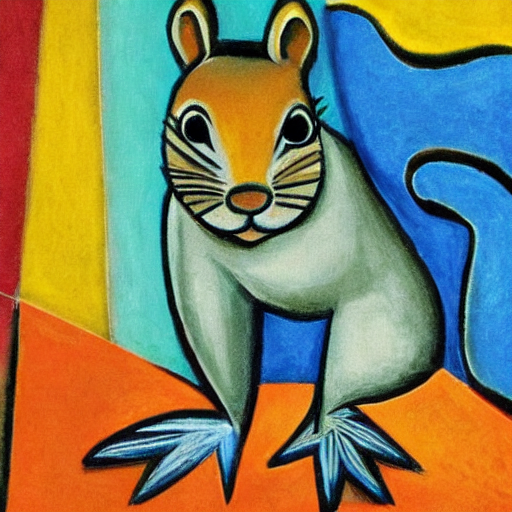

In [23]:
image = pipeline("An image of a squirrel in Picasso style").images[0]
image

In [8]:
from diffusers import UNet2DModel
repo_id = "google/ddpm-cat-256"
model = UNet2DModel.from_pretrained(repo_id, use_safetensors=True)


config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/455M [00:00<?, ?B/s]

In [10]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('dropout', 0.0),
            ('act_fn', 'si

In [11]:
import torch
torch.manual_seed(0)

In [12]:
noisy_sample = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [14]:
with torch.no_grad():
    noisy_residual = model(noisy_sample, timestep=2).sample

In [15]:
from diffusers import DDPMScheduler
scheduler = DDPMScheduler.from_pretrained(repo_id)

scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

In [16]:
scheduler

DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.29.2",
  "beta_end": 0.02,
  "beta_schedule": "linear",
  "beta_start": 0.0001,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "rescale_betas_zero_snr": false,
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}

In [19]:
def display_sample(image, index):
    image_processed = image.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)
    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {index}")
    display(image_pil)

  5%|███████████████▉                                                                                                                                                                                                                                                                                                                     | 49/1000 [00:07<01:27, 10.85it/s]

'Image at step 50'

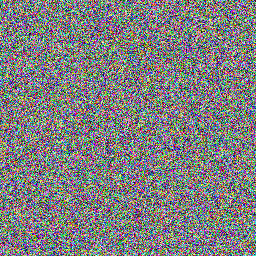

 10%|████████████████████████████████▏                                                                                                                                                                                                                                                                                                    | 99/1000 [00:11<01:22, 10.91it/s]

'Image at step 100'

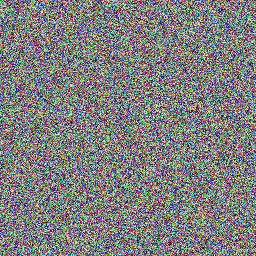

 15%|████████████████████████████████████████████████▎                                                                                                                                                                                                                                                                                   | 149/1000 [00:16<01:17, 10.92it/s]

'Image at step 150'

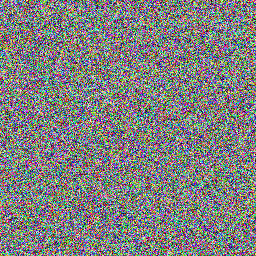

 20%|████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                                                                   | 199/1000 [00:20<01:13, 10.86it/s]

'Image at step 200'

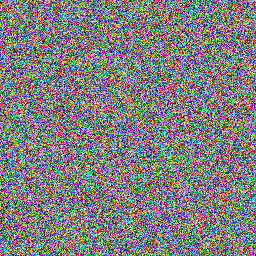

 25%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                                                                                                   | 249/1000 [00:25<01:08, 10.89it/s]

'Image at step 250'

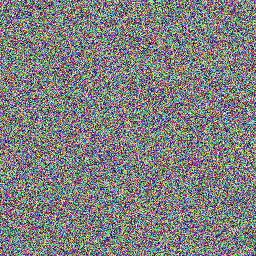

 30%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                                                                                   | 299/1000 [00:30<01:04, 10.88it/s]

'Image at step 300'

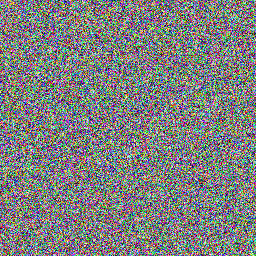

 35%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                                                                                   | 349/1000 [00:34<00:59, 10.85it/s]

'Image at step 350'

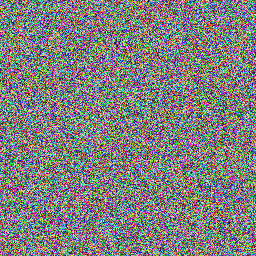

 40%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                                                  | 399/1000 [00:39<00:56, 10.68it/s]

'Image at step 400'

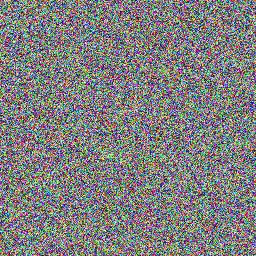

 45%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                  | 449/1000 [00:44<00:51, 10.78it/s]

'Image at step 450'

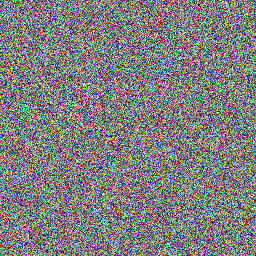

 50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                  | 499/1000 [00:48<00:46, 10.82it/s]

'Image at step 500'

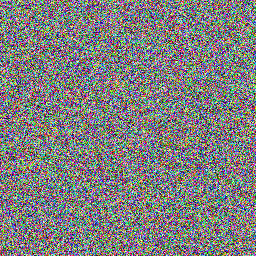

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                  | 549/1000 [00:53<00:42, 10.71it/s]

'Image at step 550'

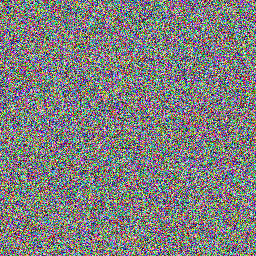

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                  | 599/1000 [00:57<00:38, 10.54it/s]

'Image at step 600'

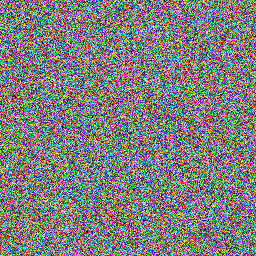

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 649/1000 [01:02<00:32, 10.75it/s]

'Image at step 650'

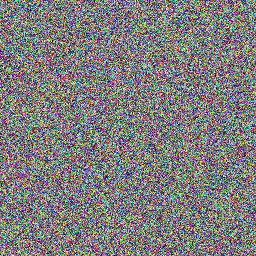

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 699/1000 [01:07<00:28, 10.65it/s]

'Image at step 700'

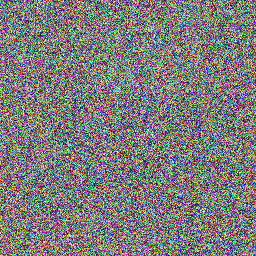

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 749/1000 [01:11<00:23, 10.68it/s]

'Image at step 750'

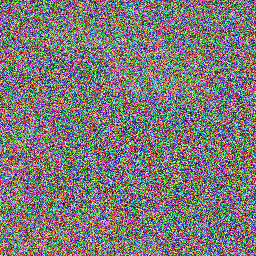

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 799/1000 [01:16<00:18, 10.78it/s]

'Image at step 800'

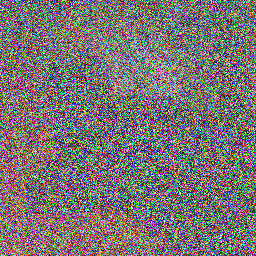

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 849/1000 [01:21<00:14, 10.77it/s]

'Image at step 850'

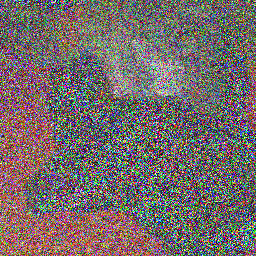

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 899/1000 [01:25<00:09, 10.62it/s]

'Image at step 900'

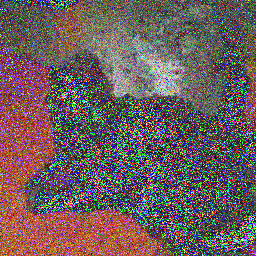

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 949/1000 [01:30<00:04, 10.68it/s]

'Image at step 950'

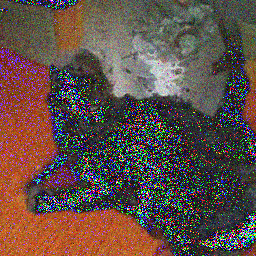

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 999/1000 [01:35<00:00, 10.54it/s]

'Image at step 1000'

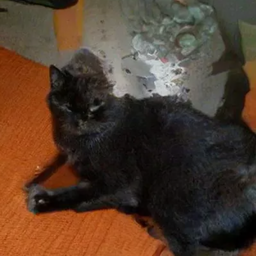

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:35<00:00, 10.47it/s]


In [21]:
import PIL.Image
import numpy as np
import tqdm

model.to("mps")
noisy_sample = noisy_sample.to("mps")
sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    with torch.no_grad():
        residual = model(sample, t).sample
    sample = scheduler.step(residual, t, sample).prev_sample
    if (i+1) % 50 == 0:
        display_sample(sample, i+1)
        

In [58]:
prompt = "image of a house"
generator = torch.Generator("mps").manual_seed(1000)

In [59]:
image = pipeline(prompt, generator=generator).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

/Users/pbanavara/miniforge3/envs/pytorch/lib/python3.12/site-packages/diffusers/image_processor.py:111: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")


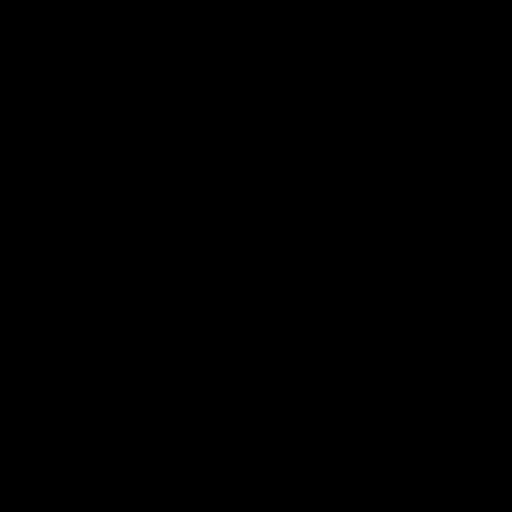

In [60]:
image

In [74]:
import torch
model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, 
                                             torch_dtype=torch.float32, 
                                             use_safetensors=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

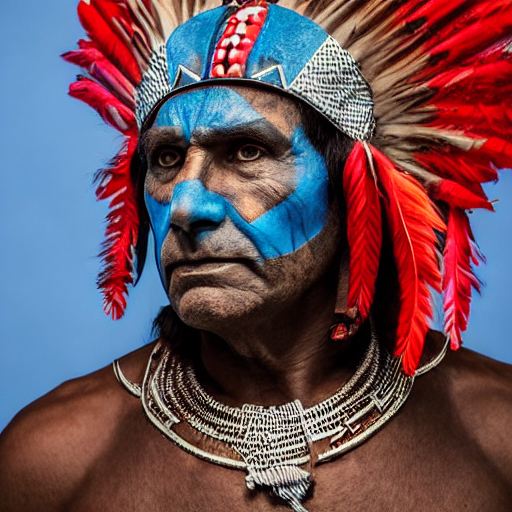

In [75]:
pipeline = pipeline.to("mps")
generator = torch.Generator("mps").manual_seed(0)
image = pipeline(prompt, generator=generator).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

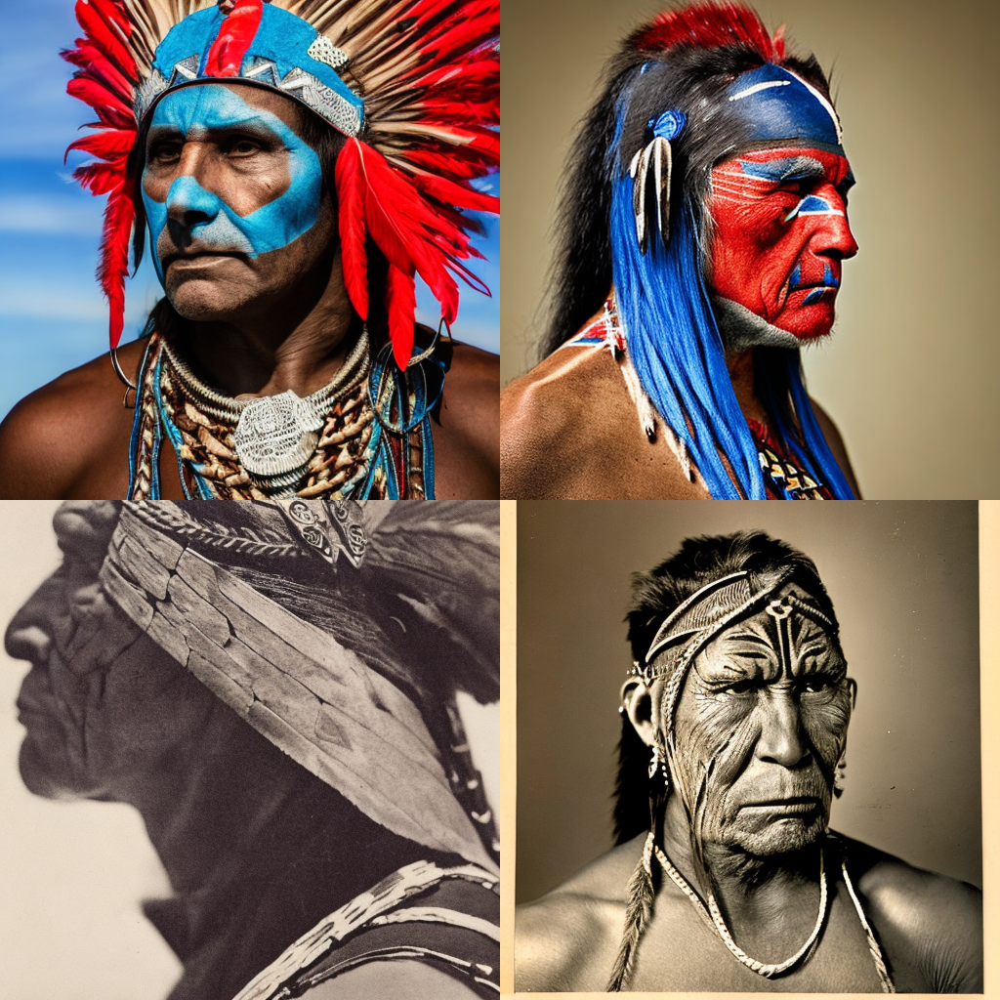

In [76]:
from diffusers import AutoencoderKL
prompt = "portrait photo of a old warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes"
def get_inputs(batch_size=1):
    generator = [torch.Generator("mps").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20
    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}
    
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float32).to("mps")
pipeline.vae = vae

from diffusers.utils import make_image_grid
pipeline.enable_attention_slicing()

images = pipeline(**get_inputs(batch_size=4)).images
make_image_grid(images, 2, 2)

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

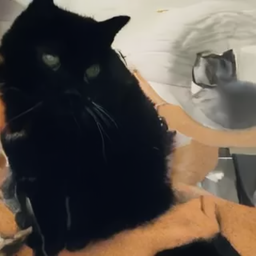

In [81]:
from diffusers import DDPMPipeline
ddpm = DDPMPipeline.from_pretrained('google/ddpm-cat-256', use_safetensors=True).to("mps")
image = ddpm(num_inference_steps=100).images[0]
image

In [82]:
from diffusers import DDPMScheduler, UNet2DModel
scheduler = DDPMScheduler.from_pretrained('google/ddpm-cat-256')
model = UNet2DModel.from_pretrained('google/ddpm-cat-256', use_safetensors=True).to("mps")

In [87]:
scheduler.set_timesteps(10)
scheduler.timesteps

tensor([900, 800, 700, 600, 500, 400, 300, 200, 100,   0])

In [88]:
import torch
sample_size = model.config.sample_size
noise = torch.randn((1, 3, sample_size, sample_size), device="mps")

input = noise
for t in scheduler.timesteps:
    with torch.no_grad():
        noisy_residual = model(input, t).sample
    previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample
    input = previous_noisy_sample

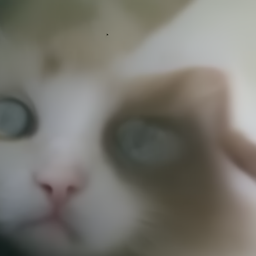

In [89]:
from PIL import Image
import numpy as np

image = (input / 2 + 0.5).clamp(0, 1).squeeze()
image = (image.permute(1, 2, 0) * 255).round().to(torch.uint8).cpu().numpy()
image = Image.fromarray(image)
image

In [11]:
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, PNDMScheduler, UNet2DConditionModel
vae = AutoencoderKL.from_pretrained('CompVis/stable-diffusion-v1-4', subfolder='vae', use_safetensors=True)
tokenizer = CLIPTokenizer.from_pretrained('CompVis/stable-diffusion-v1-4', subfolder='tokenizer')
text_encoder = CLIPTextModel.from_pretrained('CompVis/stable-diffusion-v1-4', subfolder='text_encoder', use_safetensors=True)
unet = UNet2DConditionModel.from_pretrained('CompVis/stable-diffusion-v1-4', subfolder='unet', use_safetensors=True)

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

In [13]:
from diffusers import UniPCMultistepScheduler
scheduler = UniPCMultistepScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")
torch_device = "mps"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

In [14]:
prompt = ["an astronaut sitting on a toilet"]
height, width = 512, 512
num_inference_steps = 25
guidance_scale = 7.5
generator = torch.manual_seed(0)
batch_size = len(prompt)